# Square Wave Oscillator


## Model description

## Hybrid automaton formulation

In [1]:
using ReachabilityAnalysis, Symbolics, Plots

LazySets.set_ztol(Float64, 1e-15)

function multistable_oscillator(; X0 = Interval(0.0, 0.05),
                                  V₊ = +13.5, V₋ = -13.5,
                                  R = 20.E3, C = 5.5556E-8,
                                  R1 = 20.E3, R2 = 20.E3)

    @variables x
    τ = 1/(R*C)
    α = R2/(R1+R2)

    A = -τ
    b = (τ/α) * V₊
    I₊ = HalfSpace(x <= α*V₊)
    m1 = @system(x' = Ax + b, x ∈ I₊)

    b = (τ/α) * V₋
    I₋ = HalfSpace(x >= α*V₋)
    m2 = @system(x' = Ax + b, x ∈ I₋)

    automaton = LightAutomaton(2)
    add_transition!(automaton, 1, 2, 1)
    g1 = Hyperplane(x == α*V₊)
    r1 = ConstrainedIdentityMap(1, g1)

    add_transition!(automaton, 2, 1, 2)
    g2 = Hyperplane(x == α*V₋)
    r2 = ConstrainedIdentityMap(1, g2)

    modes = [m1, m2]
    resetmaps = [r1, r2]
    H = HybridSystem(automaton, modes, resetmaps)

    # initial condition in mode 1
    X0e = [(1, X0)]
    return IVP(H, X0e)
end

multistable_oscillator (generic function with 1 method)

## Results

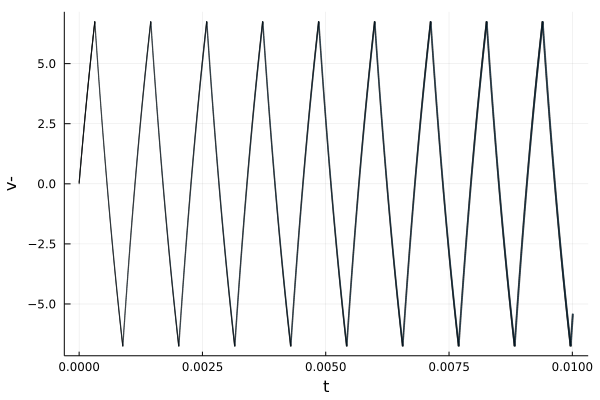

In [2]:
prob = multistable_oscillator()

sol = solve(prob, T=100e-4, alg=INT(δ=1.E-6), fixpoint_check=false);

plot(sol, vars=(0, 1), xlab="t", ylab="v-")

In [3]:
tspan.(sol)

19-element Array{IntervalArithmetic.Interval{Float64},1}:
 Interval(0.0, 0.0003200000000000056)
 Interval(0.0003169999999999972, 0.0008880000000000194)
 Interval(0.0008839999999999588, 0.0014560000000000853)
 Interval(0.0014509999999999111, 0.0020240000000001607)
 Interval(0.0020179999999998493, 0.002592000000000236)
 Interval(0.0025849999999996787, 0.0031600000000003114)
 Interval(0.003151999999999508, 0.003728000000000387)
 Interval(0.0037189999999993374, 0.004296000000000463)
 Interval(0.004285999999999002, 0.004864000000000538)
 Interval(0.004852999999998586, 0.005432000000000613)
 Interval(0.005419999999998169, 0.006000000000000689)
 Interval(0.005986999999997753, 0.006568000000000764)
 Interval(0.006553999999997336, 0.00713600000000084)
 Interval(0.00712099999999692, 0.007704000000000915)
 Interval(0.007687999999996503, 0.00827200000000139)
 Interval(0.008254999999996087, 0.008840000000001957)
 Interval(0.00882199999999567, 0.009408000000002525)
 Interval(0.009388999999995254, 0.

In [4]:
location.(sol)

19-element Array{Int64,1}:
 1
 2
 1
 2
 1
 2
 1
 2
 1
 2
 1
 2
 1
 2
 1
 2
 1
 2
 1

Let us analyze in some detail the first transition.
If we plot the last 10 reach-sets of the first flowpipe, we observe that only the
last 3 actually intersect the guard:

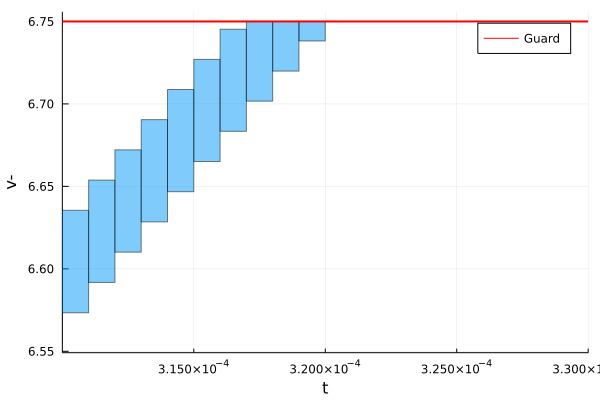

In [5]:
plot(sol[1][end-10:end], vars=(0, 1), xlab="t", ylab="v-")
plot!(x -> 6.75, xlims=(3.1e-4, 3.3e-4), lab="Guard", lw=2.0, color=:red)

We now cluster those reach-sets into a single hyperrectangle:

In [6]:
Xc = cluster(sol[1], [318, 319, 320], BoxClustering(1))

1-element Array{ReachSet{Float64,Hyperrectangle{Float64,Array{Float64,1},Array{Float64,1}}},1}:
 ReachSet{Float64,Hyperrectangle{Float64,Array{Float64,1},Array{Float64,1}}}(Hyperrectangle{Float64,Array{Float64,1},Array{Float64,1}}([6.7258286982437765], [0.024171301756223507]), Interval(0.0003169999999999972, 0.0003200000000000056))

Plotting `Xc` matches with the flowpipe after the jump:

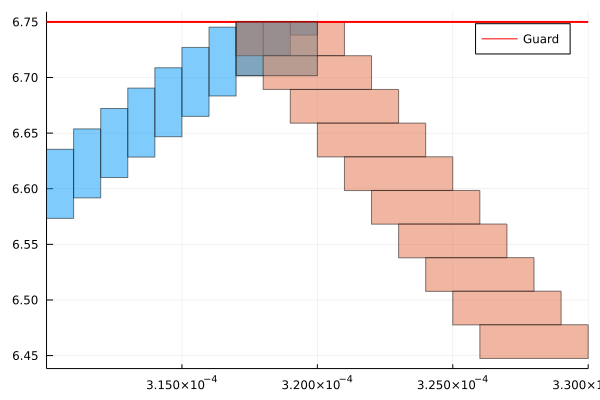

In [7]:
plot(sol[1][end-10:end], vars=(0, 1))
plot!(sol[2][1:10], vars=(0, 1))
plot!(x -> 6.75, xlims=(3.1e-4, 3.3e-4), lab="Guard", lw=2.0, color=:red)
plot!(Xc[1], vars=(0, 1), c=:grey)

Finally, we note that the algorithm finds an invariant of the system after the first
period. To activate such check pass the `fixpoint_check=true` flag to the hybrid
solve API.

In [8]:
sol = solve(prob, T=100e-4, alg=INT(δ=1.E-6), fixpoint_check=true);

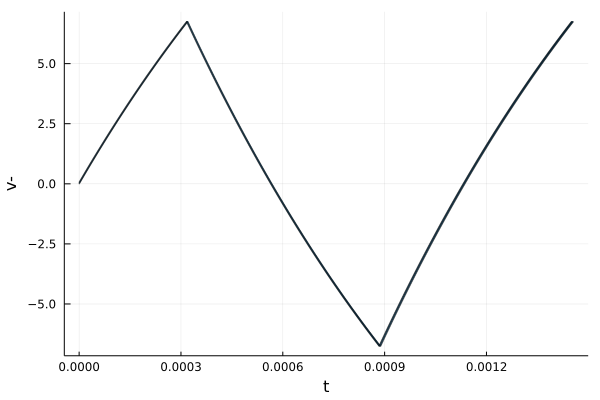

In [9]:
plot(sol, vars=(0, 1), xlab="t", ylab="v-")

When the fixpoint check is activated, the computation terminates as soon as the
last reach-set is contained in a previously explored initial state.

In [10]:
tspan(sol)

Interval(0.0, 0.0014560000000000853)

## References